**1. Import Packages**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#Set default setting of seaborn
sns.set()

**2. Read the Data**

In [2]:
#read the data
raw_data = pd.read_csv(r"C:\zubeda\PGA02_Zubu\Machine Learning Models\HeirarcicalClustering\Dataset\google_review_ratings.csv")

# print the first 5 rows
raw_data.head()

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN


**3. Data Types and Dimensions**

In [3]:
#check the data types for variables
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User         5456 non-null   object 
 1   Category 1   5456 non-null   float64
 2   Category 2   5456 non-null   float64
 3   Category 3   5456 non-null   float64
 4   Category 4   5456 non-null   float64
 5   Category 5   5456 non-null   float64
 6   Category 6   5456 non-null   float64
 7   Category 7   5456 non-null   float64
 8   Category 8   5456 non-null   float64
 9   Category 9   5456 non-null   float64
 10  Category 10  5456 non-null   float64
 11  Category 11  5456 non-null   object 
 12  Category 12  5455 non-null   float64
 13  Category 13  5456 non-null   float64
 14  Category 14  5456 non-null   float64
 15  Category 15  5456 non-null   float64
 16  Category 16  5456 non-null   float64
 17  Category 17  5456 non-null   float64
 18  Category 18  5456 non-null   float64
 19  Catego

In [4]:
# get the shape/dimension of dataset
print(raw_data.shape)

(5456, 26)


**4. Data Manipulation**

1) Removing redundant features

In [5]:
#using drop() function to remove redundant feature
data = raw_data.drop(['Unnamed: 25'], axis=1)
data.head()

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 15,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0


2) Renaming features

In [6]:
column_names = ['user_id', 'churches', 'resorts', 'beaches', 'parks', 'theatres', 'museums', 'malls', 'zoo', 'restaurants', 
                'pubs_bars', 'local_services', 'burger_pizza_shops', 
                'hotels_other_lodgings', 'juice_bars', 'art_galleries', 
                'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 
                'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens']

In [7]:
data.columns = column_names

In [8]:
data.head()

,user_id,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5456 non-null   object 
 1   churches               5456 non-null   float64
 2   resorts                5456 non-null   float64
 3   beaches                5456 non-null   float64
 4   parks                  5456 non-null   float64
 5   theatres               5456 non-null   float64
 6   museums                5456 non-null   float64
 7   malls                  5456 non-null   float64
 8   zoo                    5456 non-null   float64
 9   restaurants            5456 non-null   float64
 10  pubs_bars              5456 non-null   float64
 11  local_services         5456 non-null   object 
 12  burger_pizza_shops     5455 non-null   float64
 13  hotels_other_lodgings  5456 non-null   float64
 14  juice_bars             5456 non-null   float64
 15  art_

3) Changing data type of local_services

In [10]:
data[['local_services']] = data[['local_services']].apply(pd.to_numeric)

ValueError: Unable to parse string "2	2." at position 2712

In [11]:
data['local_services'].unique()  #getting all unique values

array(['1.7', '1.73', '1.71', '1.69', '1.67', '1.65', '1.66', '1.64',
       '1.63', '5', '1.56', '1.55', '1.53', '1.52', '1.51', '1.5', '1.49',
       '1.48', '1.46', '2.13', '2.12', '2.1', '2.09', '2.08', '2.07',
       '2.06', '2.05', '2.04', '2.03', '2.01', '2', '1.98', '1.97',
       '1.95', '1.93', '1.91', '1.9', '1.88', '1.86', '1.84', '1.83',
       '1.81', '1.79', '1.77', '1.74', '1.72', '1.68', '1.61', '1.6',
       '1.59', '1.58', '1.99', '2.47', '2.35', '2.48', '2.59', '3.39',
       '2.31', '2.78', '2.79', '2.77', '2.76', '2.75', '2.74', '2.72',
       '2.71', '2.69', '2.68', '2.66', '2.65', '2.63', '2.61', '2.57',
       '2.55', '2.53', '2.51', '2.49', '1.94', '1.92', '1.82', '1.76',
       '1.62', '4.08', '4.04', '4.02', '4.01', '4', '3.99', '3.98',
       '3.96', '3.95', '3.94', '3.93', '3.91', '3.9', '3.88', '3.87',
       '3.86', '3.84', '3.85', '2.17', '3', '2.99', '2.82', '2.83',
       '2.81', '2.8', '2.73', '2.67', '2.64', '2.62', '2.54', '2.52',
       '2.5', '2.

In [12]:
#get row number where local services in invalid
data[data['local_services'] == '2\t2.']['local_services']

2712    2\t2.
Name: local_services, dtype: object

In [13]:
data = data.drop(data[data['local_services'] == '2\t2.'].index)

In [14]:
data[['local_services']] = data[['local_services']].apply(pd.to_numeric)

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5455 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5455 non-null   object 
 1   churches               5455 non-null   float64
 2   resorts                5455 non-null   float64
 3   beaches                5455 non-null   float64
 4   parks                  5455 non-null   float64
 5   theatres               5455 non-null   float64
 6   museums                5455 non-null   float64
 7   malls                  5455 non-null   float64
 8   zoo                    5455 non-null   float64
 9   restaurants            5455 non-null   float64
 10  pubs_bars              5455 non-null   float64
 11  local_services         5455 non-null   float64
 12  burger_pizza_shops     5455 non-null   float64
 13  hotels_other_lodgings  5455 non-null   float64
 14  juice_bars             5455 non-null   float64
 15  art_

In [16]:
data_manipulated = data.copy(deep=True)  #creating a copy of a dataframe

**5. Statistical Summary**

In [17]:
#data frame with numerical features
data_manipulated.describe()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
count,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,...,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5454.000000
mean,1.455674,2.319824,2.489520,2.797192,2.959278,2.893809,3.351778,2.541047,3.126301,2.833093,...,2.206060,1.192821,0.949175,0.822374,0.969072,0.999443,0.965098,1.749941,1.530818,1.560570
std,0.827673,1.421542,1.247852,1.309084,1.338948,1.282301,1.413338,1.111338,1.356767,1.307509,...,1.715701,1.107105,0.973623,0.947993,1.202844,1.193097,0.928332,1.598275,1.316172,1.171784
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.110000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.790000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.910000,2.060000,2.460000,2.670000,2.680000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.685000,2.740000,4.095000,4.315000,3.840000,5.000000,3.190000,5.000000,3.530000,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [18]:
#data frame with categirical features
data.describe(include='object')

,user_id
count,5455
unique,5455
top,User 2058
freq,1


**6. Handling Missing Values**

In [19]:
#get the count of missing values
missing_values = data_manipulated.isnull().sum()

#print the count of missing values
print(missing_values)

user_id                  0
churches                 0
resorts                  0
beaches                  0
parks                    0
theatres                 0
museums                  0
malls                    0
zoo                      0
restaurants              0
pubs_bars                0
local_services           0
burger_pizza_shops       0
hotels_other_lodgings    0
juice_bars               0
art_galleries            0
dance_clubs              0
swimming_pools           0
gyms                     0
bakeries                 0
beauty_spas              0
cafes                    0
view_points              0
monuments                0
gardens                  1
dtype: int64


In [20]:
data_no_missing = data_manipulated.fillna(data_manipulated.mean())

In [21]:
#Rechecking missing values
missing_values = data_no_missing.isnull().sum()

#print the count of missing values
print(missing_values)

user_id                  0
churches                 0
resorts                  0
beaches                  0
parks                    0
theatres                 0
museums                  0
malls                    0
zoo                      0
restaurants              0
pubs_bars                0
local_services           0
burger_pizza_shops       0
hotels_other_lodgings    0
juice_bars               0
art_galleries            0
dance_clubs              0
swimming_pools           0
gyms                     0
bakeries                 0
beauty_spas              0
cafes                    0
view_points              0
monuments                0
gardens                  0
dtype: int64


**7. Exploratory Data Analysis**

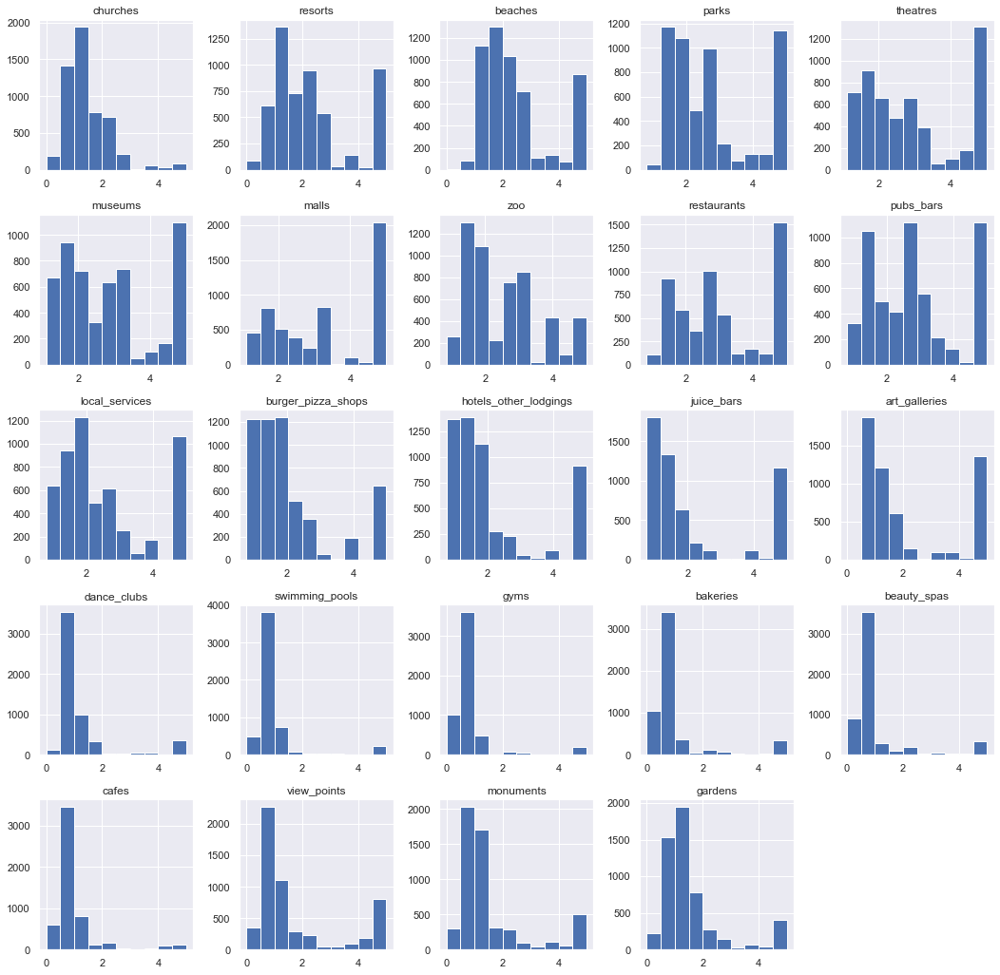

In [22]:
#PDFs of features
fig = data_no_missing.hist(figsize=(18, 18))

In [23]:
#check if users have rated all features
data_description = data_no_missing.describe()
rated = data_description.loc['min'] > 0
rated[rated]

parks                    True
theatres                 True
museums                  True
malls                    True
zoo                      True
restaurants              True
pubs_bars                True
local_services           True
burger_pizza_shops       True
hotels_other_lodgings    True
juice_bars               True
Name: min, dtype: bool

In [24]:
#creating the dataframe containing number of review for each feature
reviews = data_no_missing[column_names[1:]].astype(bool).sum(axis=0).sort_values()
reviews

bakeries                 4409
gyms                     4438
beauty_spas              4559
cafes                    4851
swimming_pools           4976
view_points              5110
monuments                5153
gardens                  5230
churches                 5260
dance_clubs              5343
resorts                  5365
art_galleries            5451
beaches                  5451
pubs_bars                5455
local_services           5455
zoo                      5455
hotels_other_lodgings    5455
juice_bars               5455
malls                    5455
museums                  5455
theatres                 5455
parks                    5455
restaurants              5455
burger_pizza_shops       5455
dtype: int64

In [25]:
column_names = data_no_missing.columns.values

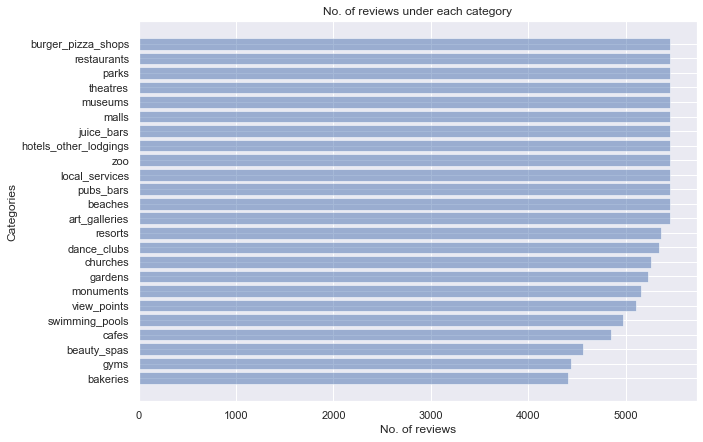

In [26]:
plt.figure(figsize=(10, 7))
plt.barh(np.arange(len(column_names[1:])), reviews.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[1:])), reviews.index)
plt.xlabel('No. of reviews')
plt.ylabel('Categories')
plt.title('No. of reviews under each category')
plt.show()

In [27]:
#creating a dataframe to store no. of reviews by users
no_of_reviews = data_no_missing[column_names[1:]].astype(bool).sum(axis=1).value_counts()
no_of_reviews

24    3724
23     505
21     457
20     243
22     167
19     148
18     114
17      69
16      22
15       6
dtype: int64

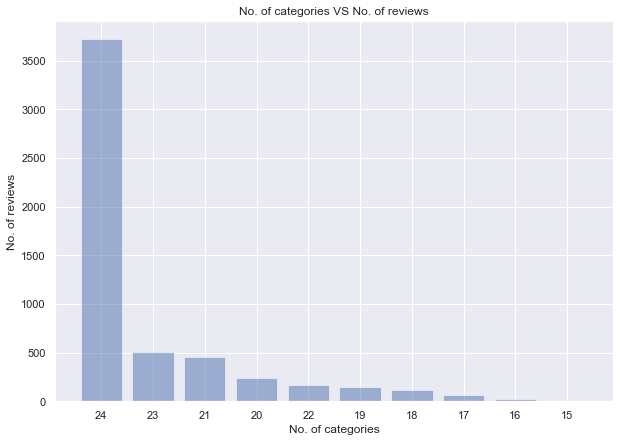

In [28]:
#plotting the no. of customers Vs no. of reviews
plt.figure(figsize=(10, 7))
plt.bar(np.arange(len(no_of_reviews)), no_of_reviews.values, align='center', alpha=0.5)
plt.xticks(np.arange(len(no_of_reviews)), no_of_reviews.index)
plt.xlabel('No. of categories')
plt.ylabel('No. of reviews')
plt.title('No. of categories VS No. of reviews')
plt.show()

In [29]:
#creating a dataframe to store average rating for each feature
avg_rating = data_no_missing[column_names[1:]].mean()  #average rating is calculated by dividing count by total number of observations
avg_rating = avg_rating.sort_values()  #sorting the rating in increasing order
avg_rating

gyms                     0.822374
swimming_pools           0.949175
cafes                    0.965098
bakeries                 0.969072
beauty_spas              0.999443
dance_clubs              1.192821
churches                 1.455674
monuments                1.530818
gardens                  1.560570
view_points              1.749941
burger_pizza_shops       2.078339
hotels_other_lodgings    2.125747
juice_bars               2.190346
art_galleries            2.206060
resorts                  2.319824
beaches                  2.489520
zoo                      2.541047
local_services           2.550071
parks                    2.797192
pubs_bars                2.833093
museums                  2.893809
theatres                 2.959278
restaurants              3.126301
malls                    3.351778
dtype: float64

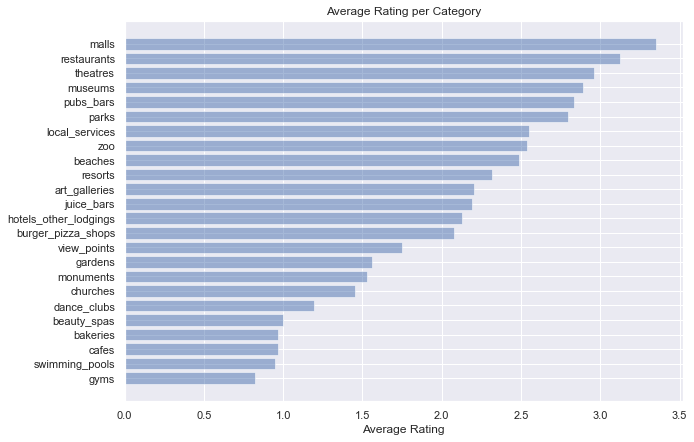

In [30]:
#plotting average rating plots
plt.figure(figsize=(10, 7))
plt.barh(np.arange(len(column_names[1:])), avg_rating.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[1:])), avg_rating.index)
plt.xlabel('Average Rating')
plt.title('Average Rating per Category')
plt.show()

In [31]:
data_1 = data_no_missing.copy()
new = data_1['user_id'].str.split(' ', n=2, expand=True)
data_1['user'] = new[0]
data_1['id'] = new[1]
data_1 = data_1.drop(['user_id', 'user'], axis=1)
data_1.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,3
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,5


In [32]:
data_final = data_1.copy(deep=True)
data_final.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,3
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,5


**8. Hierarchical Clustering**

In [33]:
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import scale as s
from scipy.cluster.hierarchy import dendrogram, linkage

In [34]:
Z = sch.linkage(data_final, method='ward')
Z
#The linkage function is the main function which calculates the distances between every combination of
#data points within the given data set, using the specified method and metric
#method='ward' is the method used in linkage function for hierarchical cluster analysis . The idea has
#much in common with analysis of variance (ANOVA). The linkage function specifying the distance
#between two clusters is computed as the increase in the "error sum of squares" (ESS) after fusing two
#clusters into a single cluster

array([[2.99000000e+02, 3.00000000e+02, 1.00005000e+00, 2.00000000e+00],
       [6.72000000e+02, 6.73000000e+02, 1.00005000e+00, 2.00000000e+00],
       [2.16000000e+03, 2.16100000e+03, 1.00005000e+00, 2.00000000e+00],
       ...,
       [1.09000000e+04, 1.09030000e+04, 3.22742555e+04, 2.06400000e+03],
       [1.09040000e+04, 1.09050000e+04, 6.91444681e+04, 3.39100000e+03],
       [1.09060000e+04, 1.09070000e+04, 1.38206963e+05, 5.45500000e+03]])

Text(0.5, 1.0, 'Hierarchical Clustering')

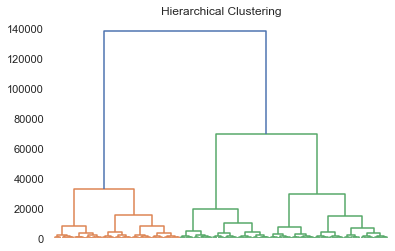

In [35]:
#Creating and plotting dendrogram
den = sch.dendrogram(Z)
plt.tick_params(axis='x',  #which axis to apply the parameters to. Default is 'both'
                which='both',  #Default is 'major'/'x', apply arguments to which ticks
                bottom=False,  #bottom, top, left, right --> bool
                top=False, 
                labelbottom=False)  #labelbottom, labeltop, labelright, labelleft
plt.title('Hierarchical Clustering')

In [36]:
#Creating a function to determine the cutting line
def fd(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

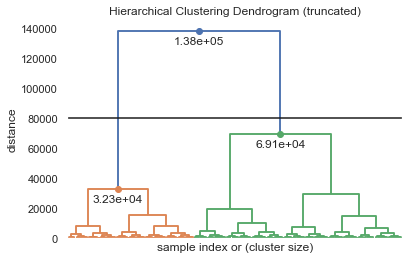

In [37]:
#Creating a dendrogram with cutting line
fd(Z, leaf_rotation=90, show_contracted=True, annotate_above=30000, max_d=80000)

den = sch.dendrogram(Z)
plt.tick_params(axis='x',  
                which='both',  
                bottom=False,  
                top=False, 
                labelbottom=False)  
#Z:ndarray - The linkage matrix encoding the hierarchical clustering to render as a dendrogram
#leaf_rotation:double, optional - Specifies the angle (in degrees) to rotate the leaf labels.
#When unspecified, the rotation is based on the number of nodes in the dendrogram (default is 0)
#show_contracted:bool, optional - When True the heights of non-singleton nodes contracted into a leaf
#node are plotted as crosses along the link connecting that leaf node. This really is only useful when
#truncation is used

**Creating a hierarchical clustering model**

In [38]:
#Importing packages
from sklearn.cluster import AgglomerativeClustering

In [39]:
#Creating an Agglomerative Clustering
hc_model = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')

In [40]:
#Fitting the model
y_cluster = hc_model.fit_predict(data_final)

Adding the cluster column

In [41]:
data_clustered = data_final.copy()

In [42]:
data_clustered["Cluster"] = y_cluster.astype('object')

In [43]:
data_clustered.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id,Cluster
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1,1
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2,1
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,3,1
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,1
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,5,1


**Visualizing the clusters**

In [44]:
cols = list(data_final.columns)
cols

['churches',
 'resorts',
 'beaches',
 'parks',
 'theatres',
 'museums',
 'malls',
 'zoo',
 'restaurants',
 'pubs_bars',
 'local_services',
 'burger_pizza_shops',
 'hotels_other_lodgings',
 'juice_bars',
 'art_galleries',
 'dance_clubs',
 'swimming_pools',
 'gyms',
 'bakeries',
 'beauty_spas',
 'cafes',
 'view_points',
 'monuments',
 'gardens',
 'id']

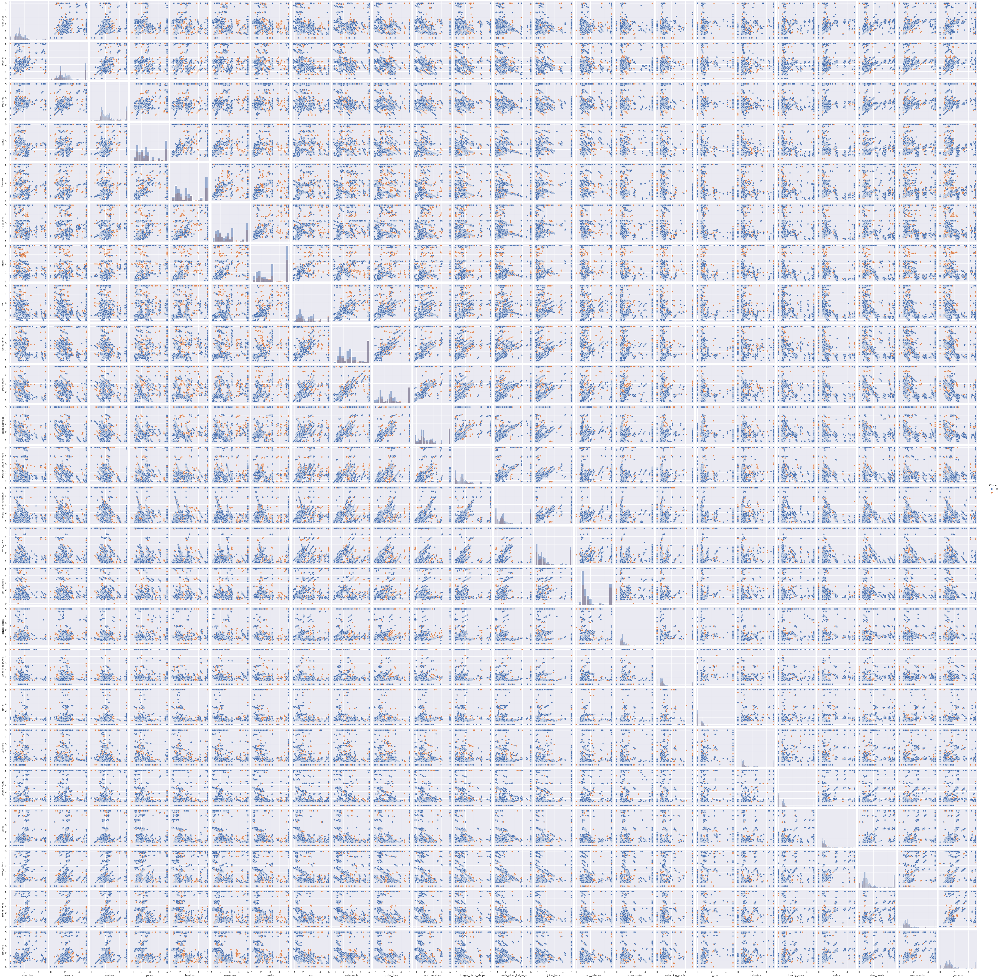

In [45]:
sns.pairplot(data_clustered, hue="Cluster", diag_kind="hist")
plt.show()

**9. Conclusion**

By using hierarchical clustering we clustered review into 2 category, positive review and negative review

In [46]:
result = data_clustered.copy()

In [47]:
result.replace({'Cluster': 1}, 'Positive', inplace=True)
result.replace({'Cluster': 0}, 'Negative', inplace=True)

In [48]:
result.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id,Cluster
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1,Positive
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2,Positive
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,3,Positive
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,Positive
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,5,Positive


In [49]:
result.sample(10)

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id,Cluster
1646,1.44,1.43,1.49,1.92,1.89,1.90,1.92,1.94,2.66,2.32,...,0.00,0.00,0.00,0.00,1.41,1.40,1.38,1.39,1647,Positive
5048,1.60,1.61,1.63,5.00,5.00,5.00,1.71,1.70,1.72,2.17,...,1.27,0.61,0.59,0.58,0.59,5.00,0.65,1.59,5049,Negative
1313,1.08,5.00,3.23,4.22,5.00,1.91,1.99,1.83,5.00,1.79,...,0.00,0.00,0.00,0.00,1.03,1.01,1.03,1.06,1314,Positive
2480,0.00,1.43,1.43,1.39,1.40,1.46,1.45,2.64,3.27,3.27,...,0.85,0.89,1.06,0.00,0.00,0.00,0.00,0.50,2481,Negative
2445,1.38,1.60,2.11,2.57,2.59,3.20,3.21,5.00,5.00,1.16,...,0.50,0.00,0.50,0.52,0.55,1.42,1.38,1.37,2446,Negative
2943,1.07,5.00,1.65,1.66,1.60,3.13,5.00,3.98,5.00,5.00,...,0.56,0.58,0.59,0.61,1.10,1.29,1.05,1.05,2944,Negative
4528,3.66,5.00,2.69,2.67,2.69,2.51,1.90,1.35,1.33,1.32,...,0.77,0.79,0.88,0.88,0.80,0.80,0.81,4.87,4529,Negative
2453,1.37,1.38,1.41,1.43,2.58,2.60,3.21,3.22,5.00,5.00,...,0.60,0.00,0.00,0.00,1.55,0.81,1.41,1.38,2454,Negative
372,1.14,5.00,2.46,2.46,2.67,2.68,2.23,2.16,5.00,2.78,...,0.73,0.74,0.89,0.87,0.77,0.76,0.88,0.94,373,Positive
875,0.79,3.65,3.71,2.72,2.67,2.19,2.61,1.40,1.68,1.35,...,0.74,0.76,0.79,0.85,0.80,0.78,0.77,0.78,876,Positive
